<h1>Содержание<span class="tocSkip"></span></h1>
<br>
<div class="toc">
    <ul class="toc-item">
        <li>
            <span>
                <a href="#1-Подготовка-окружения">
                    <span class="toc-item-num">1&nbsp;&nbsp;</span>
                    Подготовка окружения
                </a>
            </span>
        </li>
        <li>
            <span>
                <a href="#2-Загрузка-данных">
                    <span class="toc-item-num">2&nbsp;&nbsp;</span>
                    Загрузка данных
                </a>
            </span>
        </li>
        <li>
            <span>
                <a href="#3-DCGAN-64x64">
                    <span class="toc-item-num">3&nbsp;&nbsp;</span>
                    DCGAN 64x64
                </a>
            </span>
            <ul class="toc-item">
                <li>
                    <span>
                        <a href="#3.1-Генератор">
                            <span class="toc-item-num">3.1&nbsp;&nbsp;</span>
                            Генератор
                        </a>
                    </span>
                </li>
                <li>
                    <span>
                        <a href="#3.2-Дискриминатор">
                            <span class="toc-item-num">3.2&nbsp;&nbsp;</span>
                            Дискриминатор
                        </a>
                    </span>
                </li>
                <li>
                    <span>
                        <a href="#3.3-Обучение-модели">
                            <span class="toc-item-num">3.3&nbsp;&nbsp;</span>
                            Обучение модели
                        </a>
                    </span>
                </li>
            </ul>
        <li>
            <span>
                <a href="#4-Общий-вывод">
                    <span class="toc-item-num">4&nbsp;&nbsp;</span>
                    Общий вывод
                </a>
            </span>
        </li>
    </ul>
</div>

# Генеративно-состязательная сеть | DCGAN 64x64

**Постановка задачи:** натренировать генеративную модель - автоэнкодер или генеративно-состязательную сеть для генерации изображений животных.

**Источник данных:** датасет [petfaces.tar.gz](http://www.soshnikov.com/permanent/data/petfaces.tar.gz) или [Oxford-IIIT](https://www.robots.ox.ac.uk/~vgg/data/pets/).

**Характер данных:** 

* *petfaces:* 35 пород домашних животных (12 пород кошек и 23 породы собак), по 200 изображений на каждый класс (изображение центрированы и уменьшены до небольшого размера) 
* *Oxford-IIIT:* 37 категорий животных по 200 изображений на каждый класс

**Основные этапы:** 

1. Начать экспериментировать с изображениями небольшого размера - 64x64 пикселя.
2. Затем посмотреть, получится ли увеличить размер до 128x128 или 256x256.

<div style="background-color: blue; height: 2px; margin: 10px 0;"></div>

# Реализации:

1. [Базовая линейная модель](https://github.com/MAILabs-Edu-2023/magai_lab2_cnn-lab_ai/blob/main/GAN.ipynb)
2. DCGAN 64x64 (текущий файл)
3. [DCGAN 128x128](https://github.com/MAILabs-Edu-2023/magai_lab2_cnn-lab_ai/blob/main/GAN_128x128.ipynb)

**Обоснование разделения файлов:** в ходе множественных испытаний было замечено, что при последовательном обучении нескольких по-разному реализованных генеративно-состязательных сетей результаты каким-то образом воздействовали друг на друга, из-за чего генерация изображений происходила некорректно.

<div style="background-color: blue; height: 2px; margin: 10px 0;"></div>

## 1 Подготовка окружения

Установка необходимых библиотек:

In [1]:
%%capture --no-display
import torch
if torch.__version__ != '1.13.1+cu117':
    !pip3 install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu117

In [2]:
%%capture --no-display
!pip install wget torchinfo

Импорт библиотек:

In [3]:
import numpy as np

from tqdm.notebook import tqdm
from functools import reduce
from typing import Tuple

import random
import os
import kaggle
import zipfile as zf

import torch
import torch.nn as nn
import torch.optim as optim

from torch.utils.data import DataLoader, Dataset

from torchinfo import summary

from torchvision import datasets, transforms
from torchvision.utils import make_grid

from utils.plot_charts import plot_random_image, plot_transformed_images, \
                              plot_loss, save_image, create_gif, plot_comparison_real_fake

Задание случайных величин:

In [4]:
SEED = 777

random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed(SEED)

Выведение на экран текущего устройства:

In [5]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

print('Current device:', device)

Current device: cuda


<div style="background-color: blue; height: 2px; margin: 10px 0;"></div>

## 2 Загрузка данных

Добавление папки `data`:

In [6]:
if os.path.isdir('data/') == False:
    os.mkdir('data/')

Задание пути до папки с набором данных:

In [7]:
path_data = 'data/oxford_pets'

Скачивание набора данных:

In [8]:
if os.path.isdir(path_data) == False:
    os.chdir('data/')
    
    !kaggle datasets download -d tanlikesmath/the-oxfordiiit-pet-dataset
    
    with zf.ZipFile('data/the-oxfordiiit-pet-dataset.zip', 'r') as file:
        file.extractall('.')
    
    os.rename('images', 'oxford_pets')
    os.remove('the-oxfordiiit-pet-dataset.zip')
    
    os.chdir('..')

Выведение на экран изображения и его параметров:

Путь к изображению: data\oxford_pets\images\Birman_85.jpg
Класс изображения: images
Высота: 333 | Ширина: 500
Размерность изображения (333, 500, 3) -> [height, width, color_channels]


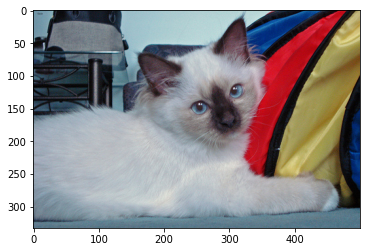

In [9]:
plot_random_image(path_data, depth='*/*')

<div style="background-color: blue; height: 2px; margin: 10px 0;"></div>

## 3 DCGAN 64x64

Структура слоёв нейросети DCGAN (Deep Convolutional GAN (Generative Adversarial Network)):

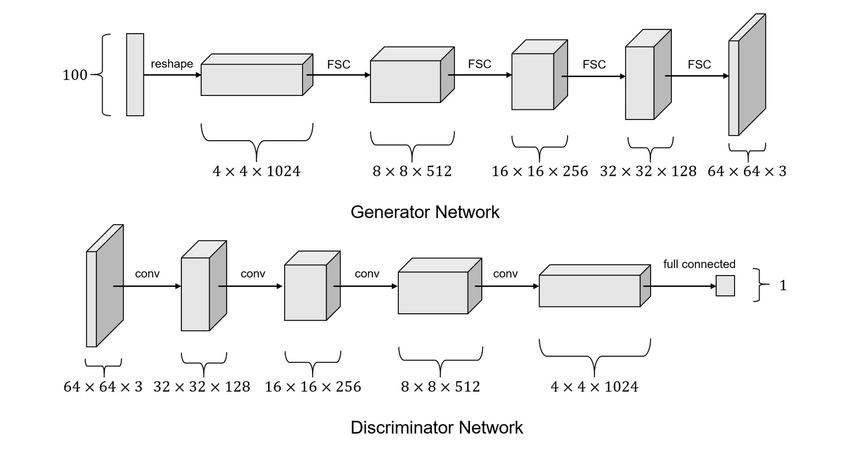

Задание функции инициализации весов:

In [10]:
def weights_init(m):
    classname = m.__class__.__name__
    
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
        
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

---

Задание констант:

In [11]:
SIZE = 64
BATCH_SIZE = 16
N_WORKERS = os.cpu_count()
SAMPLE_SIZE = 100

Задание трансформатора изображений:

In [12]:
data_transforms = transforms.Compose([
    transforms.Resize((SIZE, SIZE)), 
    transforms.ToTensor(),
])

Выведение на экран исходного и трансформированного изображений:

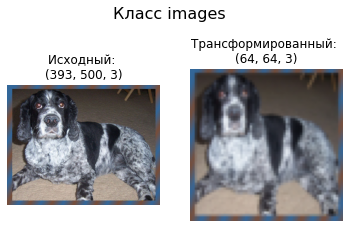

In [13]:
plot_transformed_images(data_transforms, 1, path_data, depth='*/*')

Формирование тренировочного датасета:

In [14]:
train_data = datasets.ImageFolder(
    root=path_data, 
    transform=data_transforms
)

Выведение на экран описания тренировочного датасета:

In [15]:
train_data

Dataset ImageFolder
    Number of datapoints: 7389
    Root location: data/oxford_pets
    StandardTransform
Transform: Compose(
               Resize(size=(64, 64), interpolation=bilinear, max_size=None, antialias=None)
               ToTensor()
           )

Преобразование датасета в загрузчик данных:

In [16]:
train_dataloader = DataLoader(
    dataset=train_data, 
    batch_size=BATCH_SIZE, 
    num_workers=N_WORKERS,
    shuffle=True,
    drop_last=True
)

---

### 3.1 Генератор

Задание класса генератора:

In [17]:
class Generator(nn.Module):
    def __init__(self, sample_size: int) -> None:
        super(Generator, self).__init__()
        
        self.conv1 = nn.Sequential(
            nn.ConvTranspose2d(sample_size, 512, kernel_size=4, stride=1, padding=0, bias=False),
            nn.BatchNorm2d(512),
            nn.ReLU(True)
        )
        
        self.conv2 = nn.Sequential(
            nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(256),
            nn.ReLU(True)
        )
        
        self.conv3 = nn.Sequential(
            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU(True)
        )
        
        self.conv4 = nn.Sequential(
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(64),
            nn.ReLU(True)
        )
        
        self.conv5 = nn.Sequential(
            nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
            nn.Tanh()
        )

    def forward(self, z: torch.Tensor) -> torch.Tensor:
        x = self.conv1(z)
        x = self.conv2(x)
        x = self.conv3(x)
        x = self.conv4(x)
        x = self.conv5(x)
        
        return x

Объявление класса генератора:

In [18]:
generator = Generator(SAMPLE_SIZE).apply(weights_init).to(device)

Выведение на экран слоёв генератора:

In [19]:
generator

Generator(
  (conv1): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
  )
  (conv2): Sequential(
    (0): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
  )
  (conv3): Sequential(
    (0): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
  )
  (conv4): Sequential(
    (0): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
  )
  (conv5): Sequential(
    (0): Con

Выведение на экран подробного описания процесса изменения тензоров по ходу работы модели и информации о модели:

In [20]:
summary(generator)

Layer (type:depth-idx)                   Param #
Generator                                --
├─Sequential: 1-1                        --
│    └─ConvTranspose2d: 2-1              819,200
│    └─BatchNorm2d: 2-2                  1,024
│    └─ReLU: 2-3                         --
├─Sequential: 1-2                        --
│    └─ConvTranspose2d: 2-4              2,097,152
│    └─BatchNorm2d: 2-5                  512
│    └─ReLU: 2-6                         --
├─Sequential: 1-3                        --
│    └─ConvTranspose2d: 2-7              524,288
│    └─BatchNorm2d: 2-8                  256
│    └─ReLU: 2-9                         --
├─Sequential: 1-4                        --
│    └─ConvTranspose2d: 2-10             131,072
│    └─BatchNorm2d: 2-11                 128
│    └─ReLU: 2-12                        --
├─Sequential: 1-5                        --
│    └─ConvTranspose2d: 2-13             3,072
│    └─Tanh: 2-14                        --
Total params: 3,576,704
Trainable params

---

### 3.2 Дискриминатор

Задание класса дискриминатора:

In [21]:
class Discriminator(nn.Module):
    def __init__(self) -> None:
        super(Discriminator, self).__init__()
        
        self.conv1 = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
            nn.LeakyReLU(0.2, inplace=True)
        )
        
        self.conv2 = nn.Sequential(            
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True)
        )
        
        self.conv3 = nn.Sequential(
            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True)
        )
        
        self.conv4 = nn.Sequential(
            nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True)
        )
        
        self.conv5 = nn.Sequential(
            nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, z: torch.Tensor) -> torch.Tensor:
        x = self.conv1(z)
        x = self.conv2(x)
        x = self.conv3(x)
        x = self.conv4(x)
        x = self.conv5(x)
        
        return x

Объявление класса дискриминатора:

In [22]:
discriminator = Discriminator().apply(weights_init).to(device)

Выведение на экран слоёв дискриминатора:

In [23]:
discriminator

Discriminator(
  (conv1): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
  )
  (conv2): Sequential(
    (0): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
  )
  (conv3): Sequential(
    (0): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
  )
  (conv4): Sequential(
    (0): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
  )
  (conv5): Sequential(
    (0): Conv2d(512,

Выведение на экран подробного описания процесса изменения тензоров по ходу работы модели и информации о модели:

In [24]:
summary(discriminator)

Layer (type:depth-idx)                   Param #
Discriminator                            --
├─Sequential: 1-1                        --
│    └─Conv2d: 2-1                       3,072
│    └─LeakyReLU: 2-2                    --
├─Sequential: 1-2                        --
│    └─Conv2d: 2-3                       131,072
│    └─BatchNorm2d: 2-4                  256
│    └─LeakyReLU: 2-5                    --
├─Sequential: 1-3                        --
│    └─Conv2d: 2-6                       524,288
│    └─BatchNorm2d: 2-7                  512
│    └─LeakyReLU: 2-8                    --
├─Sequential: 1-4                        --
│    └─Conv2d: 2-9                       2,097,152
│    └─BatchNorm2d: 2-10                 1,024
│    └─LeakyReLU: 2-11                   --
├─Sequential: 1-5                        --
│    └─Conv2d: 2-12                      8,192
│    └─Sigmoid: 2-13                     --
Total params: 2,765,568
Trainable params: 2,765,568
Non-trainable params: 0

---

### 3.3 Обучение модели

Задание класса обучения:

In [25]:
class DCGAN:

    def __init__(self, generator, discriminator, sample_size: int, device: str = device) -> None:
        self.generator = generator
        self.discriminator = discriminator
        self.sample_size = sample_size
        self.device = device
        
        self.fixed_noise = torch.randn(16, self.sample_size, 1, 1, device=self.device)
        
        self.real_label = 1.
        self.fake_label = 0.
        
        
    def train(self,
              n_epochs: int,
              dataloader: torch.utils.data.dataloader.DataLoader,
              criterion: torch.nn.modules.loss,
              optim_gen: torch.optim,
              optim_dis: torch.optim,
              img_title: str) -> None:
        
        self.img_title = img_title
        self.__criterion = criterion
        self.__optim_gen = optim_gen
        self.__optim_dis = optim_dis
        
        self.images = []
        self.loss_generator = []
        self.loss_discriminator = []
        
        
        for epoch in tqdm(range(n_epochs), 'Training process'):
            for i, data in enumerate(dataloader, 0):

                pred_dis, pred_gen_before, loss_dis = self.train_discriminator(data)
                loss_gen, pred_gen_after = self.train_generator()
                
                self.loss_generator.append(loss_gen)
                self.loss_discriminator.append(loss_dis)
                
                if i == 0 or i % 200 == 0 or i == len(dataloader) - 1:                    
                    self.print_iter(epoch, n_epochs, i, len(dataloader) - 1,
                                    loss_dis, loss_gen, pred_dis, pred_gen_before, pred_gen_after)
                    
                self.generator.eval()
                with torch.no_grad():
                    fake_images = self.generator(self.fixed_noise).cpu()
                    
                self.images.append(make_grid(fake_images, 4, padding=2, normalize=True))
                
            # save images
            save_image(epoch, self.img_title, self.images[-1], n_col=4)
            
    
    def print_iter(self, *args):
        print('[%d/%d][%d/%d]\tLoss Dis: %.4f\tLoss Gen: %.4f\tPred Dis: %.4f\tPred Gen: %.4f / %.4f'
              % (args))
        
        
    def train_discriminator(self, data: list) -> Tuple[float, float, float]:
        self.discriminator.zero_grad()
        
        real_images = data[0].to(self.device)
        b_size = real_images.size(0)
        self.__label = torch.full((b_size,), self.real_label, dtype=torch.float, device=self.device)

        # forward
        pred_real = self.discriminator(real_images).view(-1)
        loss_real = self.__criterion(pred_real, self.__label)

        # backward
        loss_real.backward()
        pred_dis = pred_real.mean().item()
        
        noise = torch.randn(b_size, self.sample_size, 1, 1, device=self.device)
        self.__fake_images = self.generator(noise)
        self.__label.fill_(self.fake_label)

        # forward
        pred_fake = self.discriminator(self.__fake_images.detach()).view(-1)
        loss_fake = self.__criterion(pred_fake, self.__label)

        # backward
        loss_fake.backward()
        pred_gen_before = pred_fake.mean().item()

        loss = loss_real + loss_fake
        self.__optim_dis.step()
        
        return pred_dis, pred_gen_before, loss.item()
    
    
    def train_generator(self) -> Tuple[float, float]:
        self.generator.zero_grad()
        
        self.__label.fill_(self.real_label)
        
        # forward
        pred = self.discriminator(self.__fake_images).view(-1)
        loss = self.__criterion(pred, self.__label)
        
        # backward
        loss.backward()
        pred_gen_after = pred.mean().item()
        
        self.__optim_gen.step()
        
        return loss.item(), pred_gen_after
    
    
    def print_generation_gif(self, path: str = 'visualization/') -> None:
        create_gif(self.img_title)
        
        from IPython.display import Image

        with open(f'{path}gifs/{self.img_title}.gif', 'rb') as file:
            display(Image(file.read()))

---

Задание констант:

In [26]:
N_EPOCHS = 100
CRITERION = nn.BCELoss()

LEARN_R = 2e-4
BETAS = (0.5, 0.999)

OPTIM_DIS = optim.Adam(discriminator.parameters(), lr=LEARN_R, betas=BETAS)
OPTIM_GEN = optim.Adam(generator.parameters(), lr=LEARN_R, betas=BETAS)

Объявление экземпляра класса:

In [27]:
dcgan_64 = DCGAN(generator, discriminator, SAMPLE_SIZE)

Обучение модели:

In [28]:
dcgan_64.train(
    n_epochs=N_EPOCHS,
    dataloader=train_dataloader,
    criterion=CRITERION,
    optim_gen=OPTIM_GEN,
    optim_dis=OPTIM_DIS,
    img_title='dcgan_64'
)

Training process:   0%|          | 0/100 [00:00<?, ?it/s]

[0/100][0/460]	Loss Dis: 1.6442	Loss Gen: 1.9568	Pred Dis: 0.3077	Pred Gen: 0.1058 / 0.1543
[0/100][200/460]	Loss Dis: 0.5838	Loss Gen: 8.6683	Pred Dis: 0.9044	Pred Gen: 0.3223 / 0.0028
[0/100][400/460]	Loss Dis: 0.2108	Loss Gen: 4.5885	Pred Dis: 0.9157	Pred Gen: 0.0619 / 0.0230
[0/100][460/460]	Loss Dis: 0.4446	Loss Gen: 7.2755	Pred Dis: 0.9949	Pred Gen: 0.1594 / 0.0035
[1/100][0/460]	Loss Dis: 0.1479	Loss Gen: 6.5501	Pred Dis: 0.9326	Pred Gen: 0.0598 / 0.0066
[1/100][200/460]	Loss Dis: 0.5672	Loss Gen: 1.9200	Pred Dis: 0.7740	Pred Gen: 0.0652 / 0.2605
[1/100][400/460]	Loss Dis: 0.7193	Loss Gen: 3.1961	Pred Dis: 0.7022	Pred Gen: 0.0587 / 0.1326
[1/100][460/460]	Loss Dis: 0.3474	Loss Gen: 5.3838	Pred Dis: 0.9634	Pred Gen: 0.2406 / 0.0092
[2/100][0/460]	Loss Dis: 0.4575	Loss Gen: 4.7173	Pred Dis: 0.7612	Pred Gen: 0.0987 / 0.0285
[2/100][200/460]	Loss Dis: 0.2753	Loss Gen: 4.0899	Pred Dis: 0.8235	Pred Gen: 0.0246 / 0.0293
[2/100][400/460]	Loss Dis: 0.5165	Loss Gen: 3.7461	Pred Dis: 0.826

[22/100][0/460]	Loss Dis: 0.6906	Loss Gen: 5.7293	Pred Dis: 0.9399	Pred Gen: 0.3582 / 0.0046
[22/100][200/460]	Loss Dis: 0.1532	Loss Gen: 4.1983	Pred Dis: 0.9796	Pred Gen: 0.1128 / 0.0191
[22/100][400/460]	Loss Dis: 0.3493	Loss Gen: 5.0967	Pred Dis: 0.9869	Pred Gen: 0.2480 / 0.0106
[22/100][460/460]	Loss Dis: 0.4036	Loss Gen: 3.3198	Pred Dis: 0.7881	Pred Gen: 0.0684 / 0.0452
[23/100][0/460]	Loss Dis: 0.2122	Loss Gen: 3.6149	Pred Dis: 0.8997	Pred Gen: 0.0653 / 0.0416
[23/100][200/460]	Loss Dis: 0.2668	Loss Gen: 1.8011	Pred Dis: 0.7926	Pred Gen: 0.0178 / 0.2691
[23/100][400/460]	Loss Dis: 1.8420	Loss Gen: 1.7580	Pred Dis: 0.2897	Pred Gen: 0.0105 / 0.3303
[23/100][460/460]	Loss Dis: 0.2150	Loss Gen: 5.0955	Pred Dis: 0.9802	Pred Gen: 0.1496 / 0.0135
[24/100][0/460]	Loss Dis: 0.5265	Loss Gen: 2.8217	Pred Dis: 0.6979	Pred Gen: 0.0641 / 0.0988
[24/100][200/460]	Loss Dis: 0.3032	Loss Gen: 4.0629	Pred Dis: 0.9392	Pred Gen: 0.1804 / 0.0245
[24/100][400/460]	Loss Dis: 0.3424	Loss Gen: 3.1237	Pred

[43/100][460/460]	Loss Dis: 0.0718	Loss Gen: 6.1578	Pred Dis: 0.9972	Pred Gen: 0.0501 / 0.0039
[44/100][0/460]	Loss Dis: 0.1072	Loss Gen: 5.8805	Pred Dis: 0.9664	Pred Gen: 0.0601 / 0.0070
[44/100][200/460]	Loss Dis: 0.1422	Loss Gen: 4.9016	Pred Dis: 0.8826	Pred Gen: 0.0063 / 0.0163
[44/100][400/460]	Loss Dis: 0.2995	Loss Gen: 7.8221	Pred Dis: 0.9916	Pred Gen: 0.1941 / 0.0013
[44/100][460/460]	Loss Dis: 0.0958	Loss Gen: 6.1167	Pred Dis: 0.9289	Pred Gen: 0.0188 / 0.0059
[45/100][0/460]	Loss Dis: 0.0301	Loss Gen: 7.3033	Pred Dis: 0.9744	Pred Gen: 0.0037 / 0.0031
[45/100][200/460]	Loss Dis: 0.0300	Loss Gen: 6.3285	Pred Dis: 0.9906	Pred Gen: 0.0197 / 0.0038
[45/100][400/460]	Loss Dis: 0.6159	Loss Gen: 5.5548	Pred Dis: 0.6125	Pred Gen: 0.0013 / 0.0146
[45/100][460/460]	Loss Dis: 0.4690	Loss Gen: 3.7170	Pred Dis: 0.8017	Pred Gen: 0.1821 / 0.0301
[46/100][0/460]	Loss Dis: 0.1706	Loss Gen: 5.0211	Pred Dis: 0.9935	Pred Gen: 0.1336 / 0.0088
[46/100][200/460]	Loss Dis: 0.0694	Loss Gen: 4.8944	Pred

[65/100][400/460]	Loss Dis: 0.0800	Loss Gen: 5.9978	Pred Dis: 0.9713	Pred Gen: 0.0428 / 0.0049
[65/100][460/460]	Loss Dis: 0.0304	Loss Gen: 6.0999	Pred Dis: 0.9828	Pred Gen: 0.0123 / 0.0055
[66/100][0/460]	Loss Dis: 0.0173	Loss Gen: 6.3965	Pred Dis: 0.9923	Pred Gen: 0.0092 / 0.0044
[66/100][200/460]	Loss Dis: 0.0273	Loss Gen: 5.7245	Pred Dis: 0.9827	Pred Gen: 0.0090 / 0.0230
[66/100][400/460]	Loss Dis: 0.1976	Loss Gen: 5.7250	Pred Dis: 0.9740	Pred Gen: 0.1187 / 0.0067
[66/100][460/460]	Loss Dis: 0.0954	Loss Gen: 4.8064	Pred Dis: 0.9525	Pred Gen: 0.0346 / 0.0193
[67/100][0/460]	Loss Dis: 0.4151	Loss Gen: 4.0217	Pred Dis: 0.8219	Pred Gen: 0.0152 / 0.0877
[67/100][200/460]	Loss Dis: 0.1928	Loss Gen: 6.9697	Pred Dis: 0.9934	Pred Gen: 0.1141 / 0.0025
[67/100][400/460]	Loss Dis: 0.0332	Loss Gen: 6.2849	Pred Dis: 0.9714	Pred Gen: 0.0035 / 0.0045
[67/100][460/460]	Loss Dis: 0.0273	Loss Gen: 5.5394	Pred Dis: 0.9844	Pred Gen: 0.0111 / 0.0076
[68/100][0/460]	Loss Dis: 0.0287	Loss Gen: 5.9658	Pred

[87/100][200/460]	Loss Dis: 0.0406	Loss Gen: 5.6965	Pred Dis: 0.9969	Pred Gen: 0.0333 / 0.0089
[87/100][400/460]	Loss Dis: 0.0433	Loss Gen: 6.1228	Pred Dis: 0.9751	Pred Gen: 0.0148 / 0.0103
[87/100][460/460]	Loss Dis: 0.0714	Loss Gen: 7.8610	Pred Dis: 0.9443	Pred Gen: 0.0013 / 0.0028
[88/100][0/460]	Loss Dis: 0.1167	Loss Gen: 8.4029	Pred Dis: 0.9612	Pred Gen: 0.0560 / 0.0035
[88/100][200/460]	Loss Dis: 0.0699	Loss Gen: 7.0174	Pred Dis: 0.9846	Pred Gen: 0.0476 / 0.0042
[88/100][400/460]	Loss Dis: 0.0683	Loss Gen: 6.2036	Pred Dis: 0.9858	Pred Gen: 0.0499 / 0.0044
[88/100][460/460]	Loss Dis: 0.2048	Loss Gen: 7.1812	Pred Dis: 0.9973	Pred Gen: 0.0909 / 0.0015
[89/100][0/460]	Loss Dis: 0.0778	Loss Gen: 7.2124	Pred Dis: 0.9767	Pred Gen: 0.0417 / 0.0021
[89/100][200/460]	Loss Dis: 0.0139	Loss Gen: 6.3767	Pred Dis: 0.9911	Pred Gen: 0.0049 / 0.0044
[89/100][400/460]	Loss Dis: 0.0197	Loss Gen: 8.2589	Pred Dis: 0.9831	Pred Gen: 0.0021 / 0.0007
[89/100][460/460]	Loss Dis: 0.1307	Loss Gen: 7.7544	Pr

Выведение на экран графика значений функции потерь:

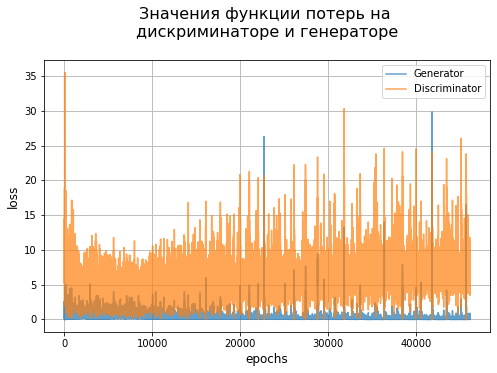

In [29]:
plot_loss(dcgan_64.loss_generator, dcgan_64.loss_discriminator)

Выведение на экран результата обучения:

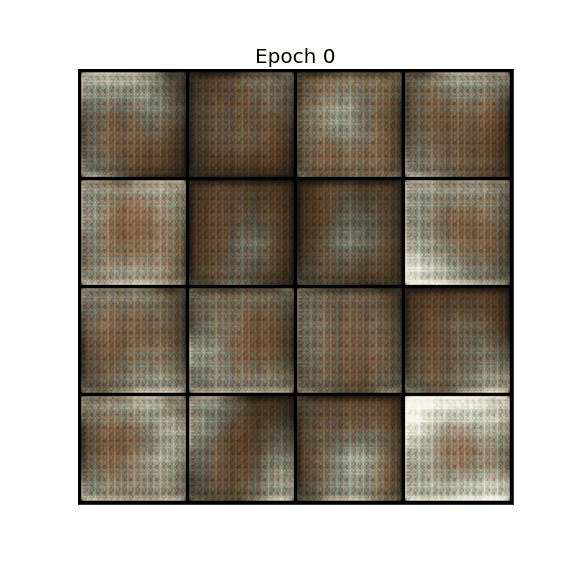

In [30]:
dcgan_64.print_generation_gif()

Выведение сравнения настоящих и сгенерированных фотографий:

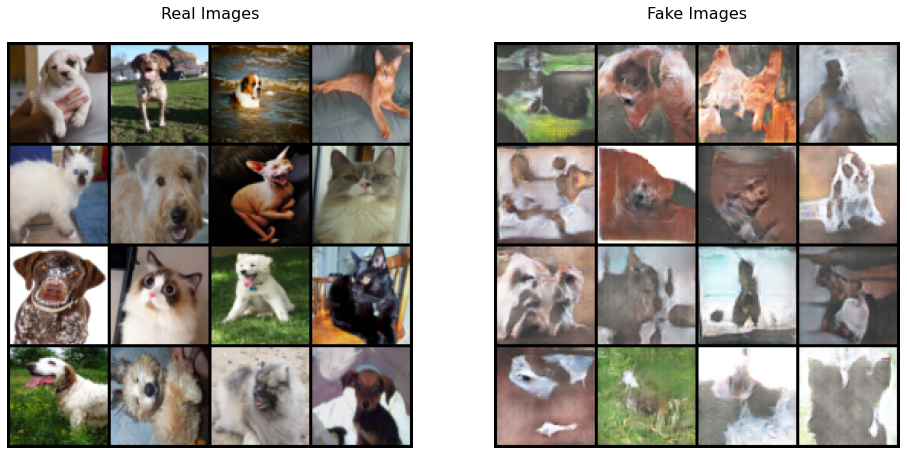

In [31]:
plot_comparison_real_fake(train_dataloader, dcgan_64.images, device)

>Образы модели пусть и отдалённо, но напоминают животных.

<div style="background-color: blue; height: 2px; margin: 10px 0;"></div>

## 4 Общий вывод

На основании датасета с домашними животными был проведён эксперимент по построению генеративно-состязательной сети DCGAN (обучение проведено на датасете с размером изображений 64х64), которая продемонстрировала хороший предсказательный потенциал в рамках поставленной задачи. Причём результаты предсказаний сети могли бы быть ещё лучше при условии её обучения при большем количестве итераций.

<div style="text-align: center; font-size: 20px; padding: 15px 0;">
    <a href="#Содержание" data-toc-modified-id="Содержание" style="text-decoration: none; color: #296eaa; border: 2px dashed #296eaa; opacity: 0.8; border-radius: 3px; padding: 10px 80px;">
        В начало файла ↑
    </a>
</div>